In [ ]:
import tensorflow as tf
import cv2
import os
os.environ["SM_FRAMEWORK"] = "tf.keras"
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split
import segmentation_models as sm
from tensorflow.keras.utils import to_categorical, plot_model
from tensorflow.keras.callbacks import EarlyStopping, CSVLogger
from skimage.segmentation import mark_boundaries
from skimage.color import label2rgb
import seaborn as sns

POVODNE

In [ ]:
images = glob.glob(r"C:\Users\Admin\Documents\xbemberakova\pythonProject1\Nove\NoveAllImages\NoveAllImages\Segmentacia\train_val_2360_expert_img\*.jpg")
images.sort()
masks = glob.glob(r"C:\Users\Admin\Documents\xbemberakova\pythonProject1\Nove\NoveAllMaskyExpert\NoveAllMaskyExpert\Segmentacia\train_val_2360_expert_mask\*.png")
masks.sort()

In [ ]:
images_test = glob.glob(r"C:\Users\Admin\Documents\xbemberakova\pythonProject1\Nove\NoveAllMaskyExpert\NoveAllMaskyExpert\Vybalancovane\110val_img_comb\*.jpg")
images_test.sort()
masks_test = glob.glob(r"C:\Users\Admin\Documents\xbemberakova\pythonProject1\Nove\NoveAllMaskyExpert\NoveAllMaskyExpert\Vybalancovane\110val_mask_comb\*.png")
masks_test.sort()

In [ ]:
print(images_test[0])

print(masks_test[0])

C:\Users\Admin\Documents\xbemberakova\pythonProject1\Nove\NoveAllMaskyExpert\NoveAllMaskyExpert\Vybalancovane\110val_img_comb\041.jpg
C:\Users\Admin\Documents\xbemberakova\pythonProject1\Nove\NoveAllMaskyExpert\NoveAllMaskyExpert\Vybalancovane\110val_mask_comb\041.png


In [ ]:
import os
image=[]
mask=[]

image_file_names = []

for x,y in zip(images, masks):
  im=cv2.imread(x,cv2.IMREAD_COLOR)
  im=cv2.resize(im,(128,128))
  im=im/255
  image.append(im)
  ma=cv2.imread(y,cv2.IMREAD_GRAYSCALE)
  ma=cv2.resize(ma,(128,128),interpolation=cv2.INTER_NEAREST)
  ma=ma/255
  ma=np.expand_dims(ma,axis=-1)
  mask.append(ma)
  image_file_names.append(os.path.basename(x))

In [ ]:
import os
image_test=[]
mask_test=[]

image_file_names_test = []

for x,y in zip(images_test, masks_test):
  im=cv2.imread(x,cv2.IMREAD_COLOR)
  im=cv2.resize(im,(128,128))
  im=im/255
  image_test.append(im)
  ma=cv2.imread(y,cv2.IMREAD_GRAYSCALE)
  ma=cv2.resize(ma,(128,128),interpolation=cv2.INTER_NEAREST)
  ma=ma/255
  ma=np.expand_dims(ma,axis=-1)
  mask_test.append(ma)
  image_file_names_test.append(os.path.basename(x))

In [ ]:
img_array=np.array(image)
mask_array=np.array(mask)
mask_array=mask_array.astype(np.float32)
print(mask_array.shape)

(2360, 128, 128, 1)


In [ ]:
img_array_test=np.array(image_test)
mask_array_test=np.array(mask_test)
mask_array_test=mask_array_test.astype(np.float32)
print(mask_array_test.shape)

(110, 128, 128, 1)


In [ ]:
np.unique(mask_array_test)

array([0.        , 0.00392157, 0.00784314], dtype=float32)

In [ ]:
from sklearn.preprocessing import LabelEncoder
labelencoder = LabelEncoder()
a,n,h, w = mask_array.shape
train_masks_reshaped = mask_array.reshape(-1,1)
train_masks_reshaped_encoded = labelencoder.fit_transform(train_masks_reshaped)
train_masks_encoded_original_shape = train_masks_reshaped_encoded.reshape(a,n, h, w)

C:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\preprocessing\_label.py:114: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [ ]:
from sklearn.preprocessing import LabelEncoder
labelencoder = LabelEncoder()
a,n,h, w = mask_array_test.shape
test_masks_reshaped = mask_array_test.reshape(-1,1)
test_masks_reshaped_encoded = labelencoder.fit_transform(test_masks_reshaped)
test_masks_encoded_original_shape = test_masks_reshaped_encoded.reshape(a,n, h, w)

C:\Users\Admin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\preprocessing\_label.py:114: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [ ]:
from tensorflow.keras.utils import to_categorical
mask_array=to_categorical(train_masks_encoded_original_shape,num_classes=3)

In [ ]:
from tensorflow.keras.utils import to_categorical
mask_array_test=to_categorical(test_masks_encoded_original_shape,num_classes=3)

In [ ]:
import segmentation_models as sm
from segmentation_models import Unet
from segmentation_models import get_preprocessing
from tensorflow.keras.utils import plot_model
sm.set_framework('tf.keras')
sm.framework()
BACKBONE = 'efficientnetb1'

preprocess_input = get_preprocessing(BACKBONE)
model = Unet(BACKBONE, encoder_weights='imagenet',input_shape=(128,128,3),activation='softmax',classes=2)
model.summary()
# plot_model(model)

Model: "model_10"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_11 (InputLayer)       [(None, 128, 128, 3)]        0         []                            
                                                                                                  
 stem_conv (Conv2D)          (None, 64, 64, 32)           864       ['input_11[0][0]']            
                                                                                                  
 stem_bn (BatchNormalizatio  (None, 64, 64, 32)           128       ['stem_conv[0][0]']           
 n)                                                                                               
                                                                                                  
 stem_activation (Activatio  (None, 64, 64, 32)           0         ['stem_bn[0][0]']      

In [ ]:
# original funguje
import numpy as np
from sklearn.model_selection import train_test_split
import segmentation_models as sm
from segmentation_models import Unet
from segmentation_models import get_preprocessing
import tensorflow as tf
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import EarlyStopping, CSVLogger
import matplotlib.pyplot as plt

# Assuming img_array is your images and mask_array is your labels/masks
# First, split data into training and a temporary set (80% training, 20% temp)

x_train, x_val, y_train, y_val, image_names_train, image_names_val = train_test_split(img_array, mask_array, image_file_names, test_size=0.10, random_state=42)
# x_train, x_temp, y_train, y_temp, = train_test_split(img_array, mask_array, test_size=0.20, random_state=42)

# Now split the temporary set into validation and test sets (50% each of the temp set)
x_test1, x_test2, y_test1, y_test2, image_names_test1, image_names_test2 = train_test_split(img_array_test, mask_array_test, image_file_names_test, test_size=0.5, random_state=42)
# x_val, x_test, y_val, y_test = train_test_split(x_temp, y_temp, test_size=0.50, random_state=42)

x_test = np.concatenate((x_test1, x_test2), axis=0)
y_test = np.concatenate((y_test1, y_test2), axis=0)
image_names_test = np.concatenate((image_names_test1, image_names_test2), axis=0)

# Output the shapes of your datasets to verify correct splits
print(f"image_names_train size: {len(image_names_train)}")
print(f"image_names_temp size: {len(image_names_val)}")
print(f"image_names_val size: {len(image_names_test)}")
print(f"Training data shape: {x_train.shape}, Label data shape: {y_train.shape}")
print(f"Val  data shape: {x_val.shape}, Label labels dtype: {y_val.shape}")
print(f"Test  data shape: {x_test.shape}, Label labels dtype: {y_test.shape}")

# Set the framework for segmentation models to TensorFlow/Keras
sm.set_framework('tf.keras')
print(sm.framework())

# Specify the backbone model
BACKBONE = 'efficientnetb1'
preprocess_input = get_preprocessing(BACKBONE)

# Create the U-Net model
model = Unet(BACKBONE, encoder_weights='imagenet', input_shape=(128, 128, 3), activation='softmax', classes=3)

# Compile the model with Dice loss and multiple metrics
model.compile(optimizer='adam', loss=sm.losses.DiceLoss(), metrics=['accuracy', tf.keras.metrics.Recall(), tf.keras.metrics.Precision(), tf.keras.metrics.AUC(), sm.metrics.IOUScore(), sm.metrics.FScore()])

# CSV Logger to log epoch results and EarlyStopping to monitor validation loss
csv_logger = CSVLogger('model-1.csv')
early_stopping = EarlyStopping(monitor='val_loss', patience=2, verbose=1, restore_best_weights=True)


image_names_train size: 2124
image_names_temp size: 236
image_names_val size: 110
Training data shape: (2124, 128, 128, 3), Label data shape: (2124, 128, 128, 3)
Val  data shape: (236, 128, 128, 3), Label labels dtype: (236, 128, 128, 3)
Test  data shape: (110, 128, 128, 3), Label labels dtype: (110, 128, 128, 3)
tf.keras


In [ ]:
# Fit the model on the training data and validate on the validation data
history = model.fit(x_train, y_train,
                    batch_size=2,
                    epochs=25,
                    validation_data=(x_val, y_val),
                    callbacks=[csv_logger, early_stopping])

Epoch 1/25
1062/1062 [==============================] - 234s 201ms/step - loss: 0.1400 - accuracy: 0.8810 - recall_5: 0.8793 - precision_5: 0.8826 - auc_5: 0.9348 - iou_score: 0.7668 - f1-score: 0.8600 - val_loss: 0.1239 - val_accuracy: 0.8947 - val_recall_5: 0.8947 - val_precision_5: 0.8948 - val_auc_5: 0.9382 - val_iou_score: 0.7904 - val_f1-score: 0.8761
Epoch 2/25
1062/1062 [==============================] - 212s 199ms/step - loss: 0.1149 - accuracy: 0.9014 - recall_5: 0.9013 - precision_5: 0.9014 - auc_5: 0.9397 - iou_score: 0.8032 - f1-score: 0.8851 - val_loss: 0.1448 - val_accuracy: 0.8754 - val_recall_5: 0.8754 - val_precision_5: 0.8754 - val_auc_5: 0.9198 - val_iou_score: 0.7619 - val_f1-score: 0.8552
Epoch 3/25
1062/1062 [==============================] - 213s 200ms/step - loss: 0.1113 - accuracy: 0.9062 - recall_5: 0.9062 - precision_5: 0.9063 - auc_5: 0.9411 - iou_score: 0.8101 - f1-score: 0.8887 - val_loss: 0.1330 - val_accuracy: 0.8896 - val_recall_5: 0.8895 - val_precisi

In [ ]:
import numpy as np
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
# Make predictions on the test set
test_preds = model.predict(x_test)
preds_test_thresh = np.argmax(test_preds, axis=-1).astype(np.uint8)

# Reshape y_test as needed for accuracy calculation
y_test_reshaped = np.argmax(y_test, axis=-1).astype(np.uint8) if y_test.ndim > 2 else y_test
if y_test_reshaped.ndim > 1:
    y_test_reshaped = y_test_reshaped.flatten()

# Calculate test accuracy
test_accuracy = accuracy_score(y_test_reshaped, preds_test_thresh.flatten())
print(f"Test Accuracy: {test_accuracy:.2%}")

4/4 [==============================] - 2s 253ms/step
Test Accuracy: 89.86%


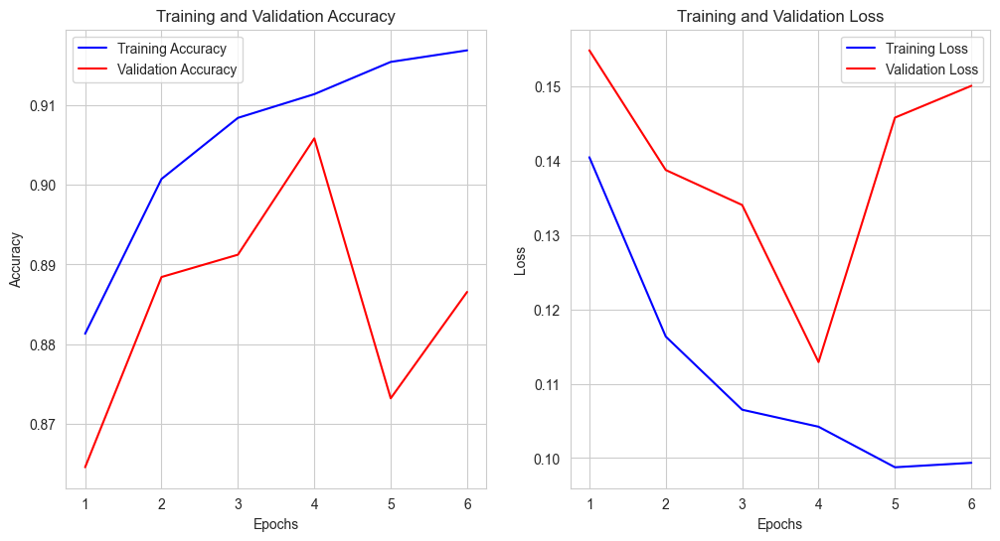

In [ ]:
import matplotlib.pyplot as plt

# Assuming 'history' is the variable holding the output from the fit function
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(acc) + 1)

# Plot training and validation accuracy
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(epochs, acc, 'b-', label='Training Accuracy')
plt.plot(epochs, val_acc, 'r-', label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

# Plot training and validation loss
plt.subplot(1, 2, 2)
plt.plot(epochs, loss, 'b-', label='Training Loss')
plt.plot(epochs, val_loss, 'r-', label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()


In [ ]:
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import segmentation_models as sm
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import EarlyStopping, CSVLogger
from segmentation_models import Unet
from segmentation_models import get_preprocessing
from tensorflow.keras.utils import to_categorical

# Set the directory to save predicted masks and Excel file
output_directory = r'C:\Users\Admin\Documents\xbemberakova\pythonProject1\Nove\klasotuput\predicted'
excel_file_path = r'C:\Users\Admin\Documents\xbemberakova\pythonProject1\Nove\klasotuput\predicted.xlsx'

# Ensure the output directory exists
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

# Prepare data structures for images and masks
data = {'ImgName': [], 'Label': []}

# Prepare the model for predictions (assuming model and data preparation is done as above)
# For example, let's assume your model is named 'model' and your test sets are 'x_test', 'y_test'

# Predict masks using the model
predictions = model.predict(x_test)
predicted_masks = (np.argmax(predictions, axis=-1)).astype(np.uint8)

4/4 [==============================] - 1s 245ms/step


564


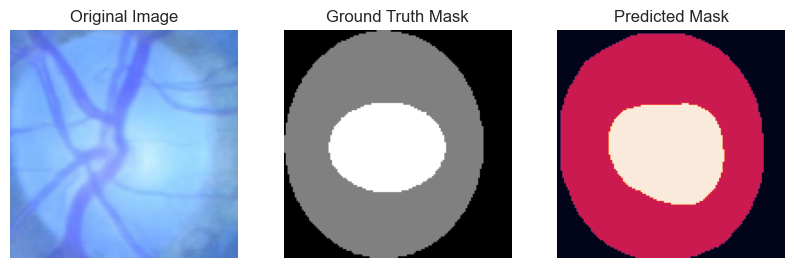

233


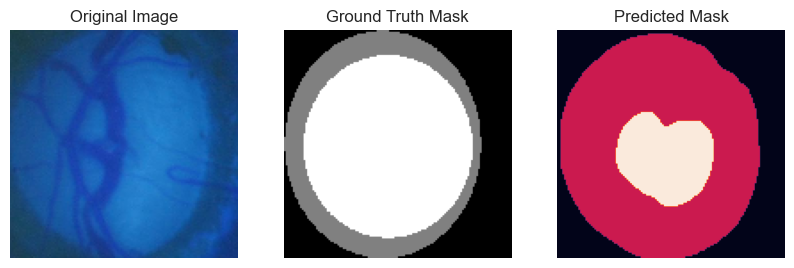

n0206


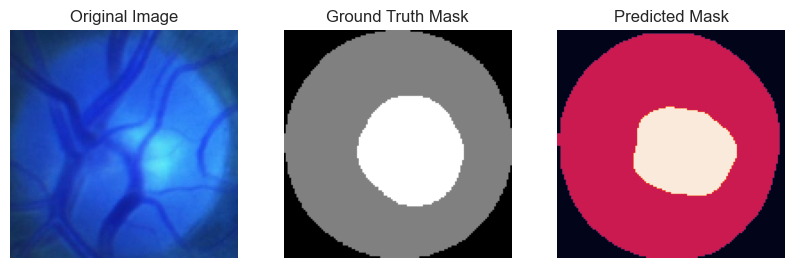

g0037


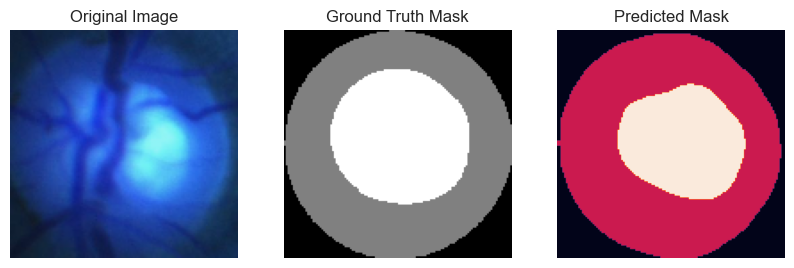

287


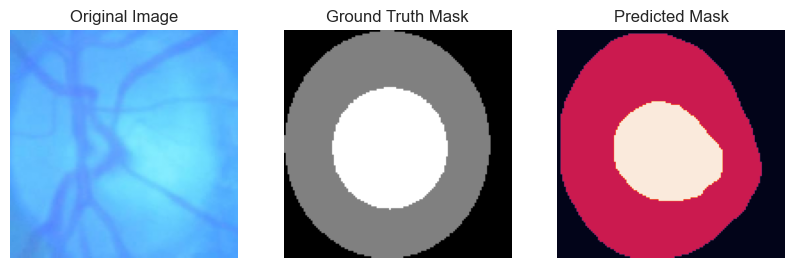

image_2906


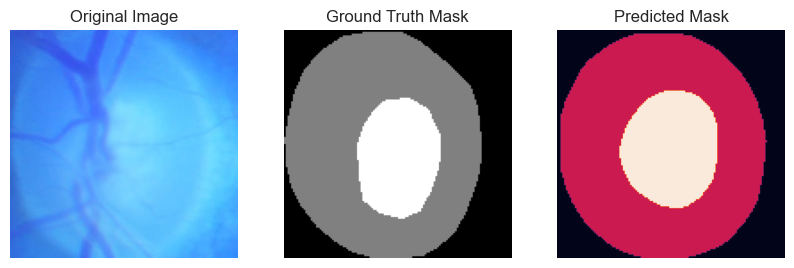

529


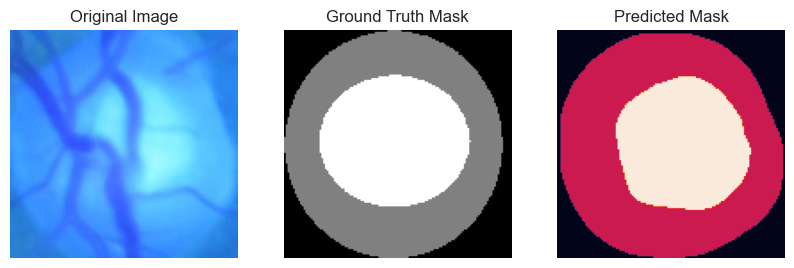

094


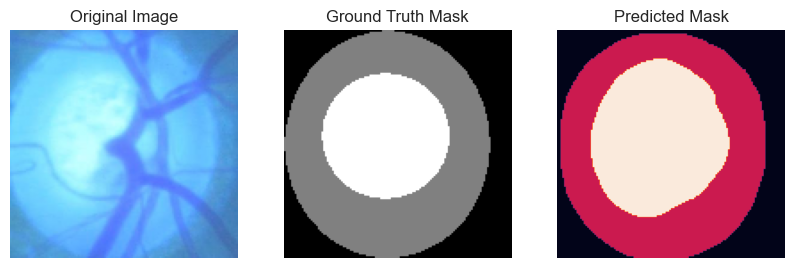

359


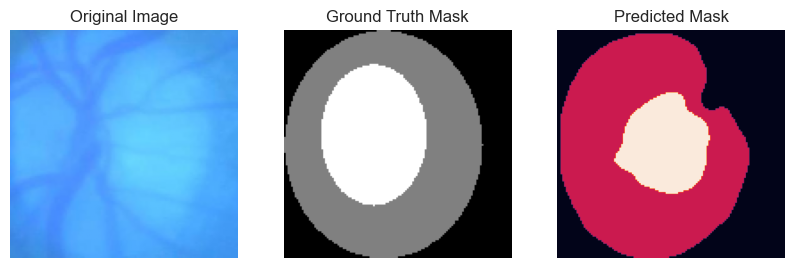

V0214


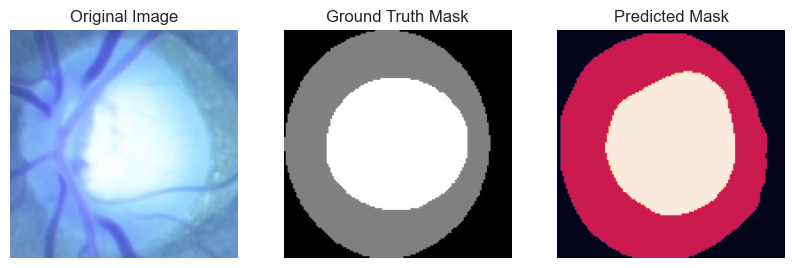

image_485


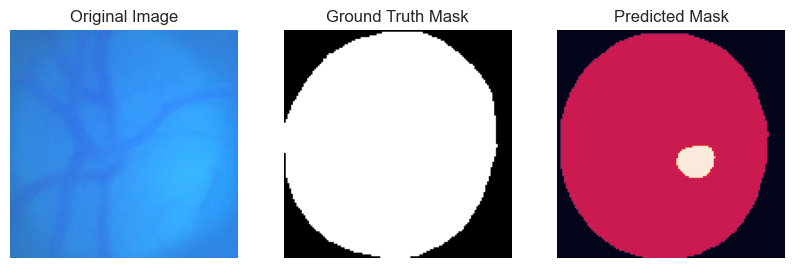

207


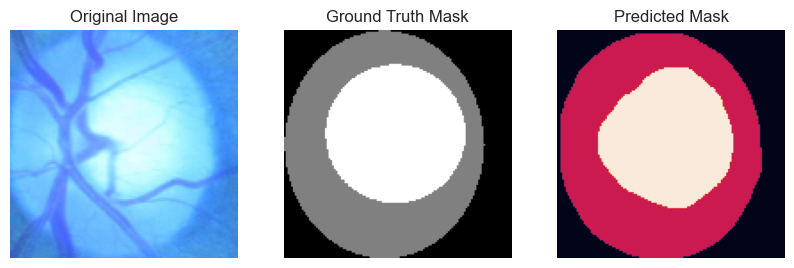

n0273


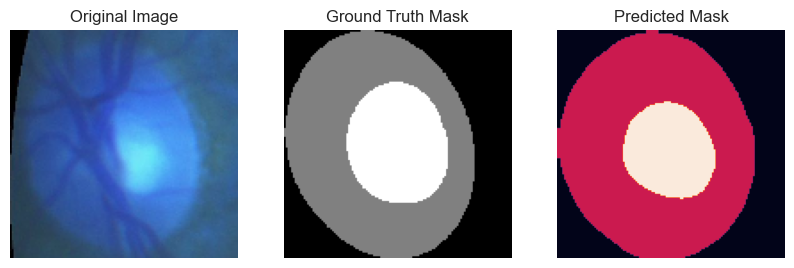

n0107


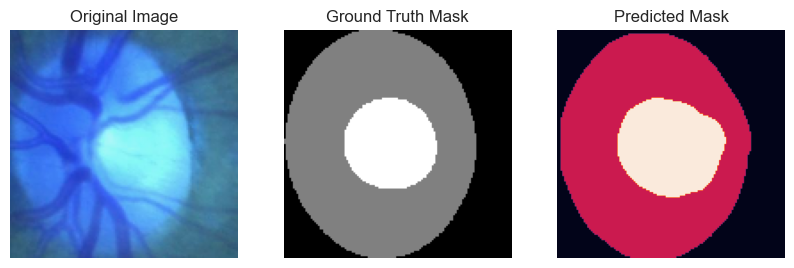

image_916


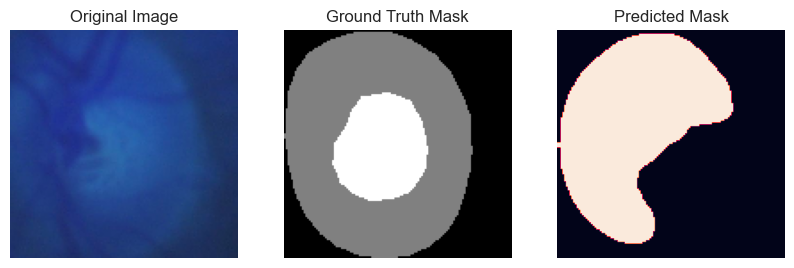

image_1317


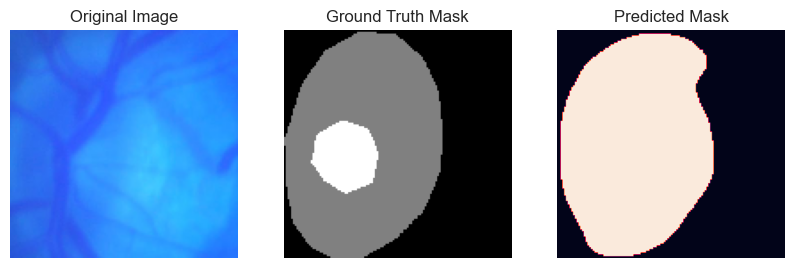

image_103


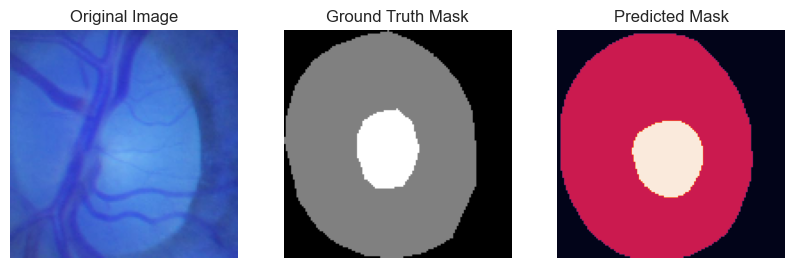

n0149


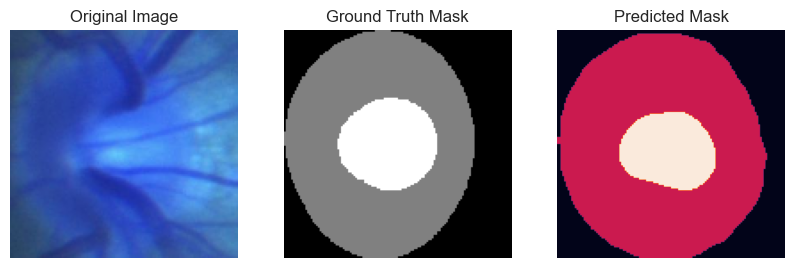

g0011


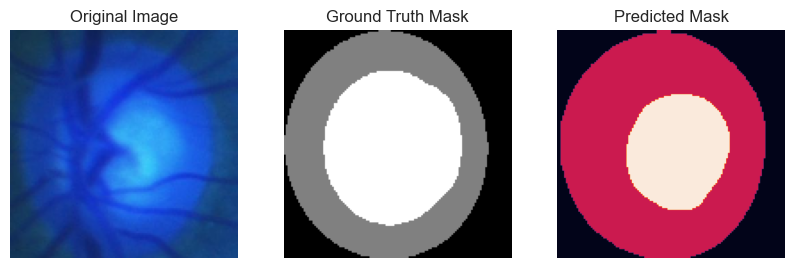

image_3143


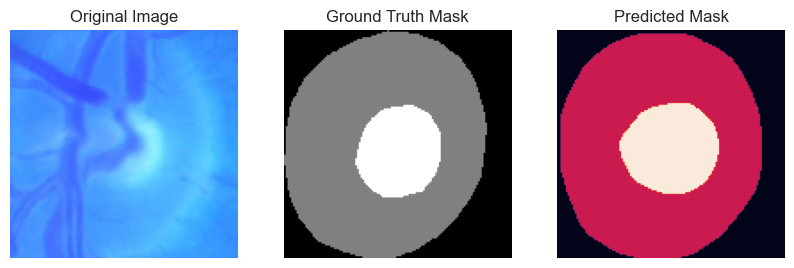

image_1917


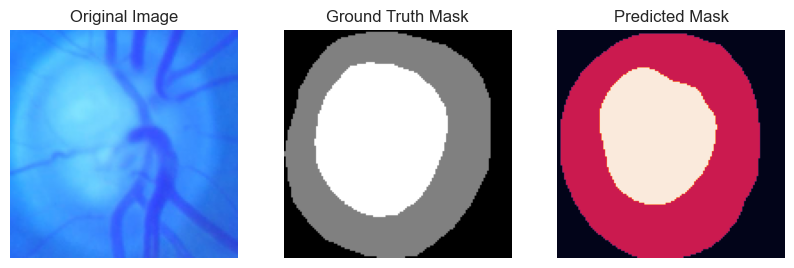

n0291


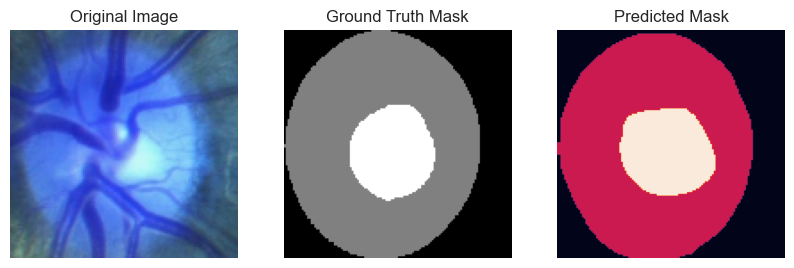

n0200


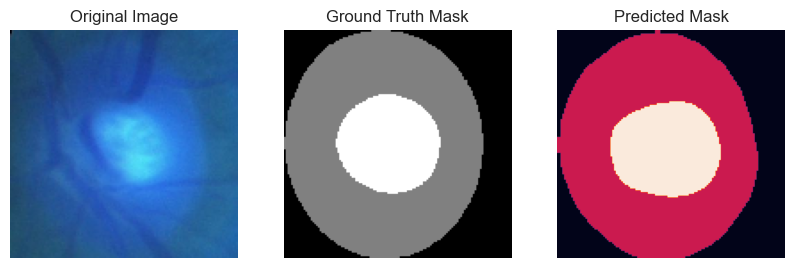

V0282


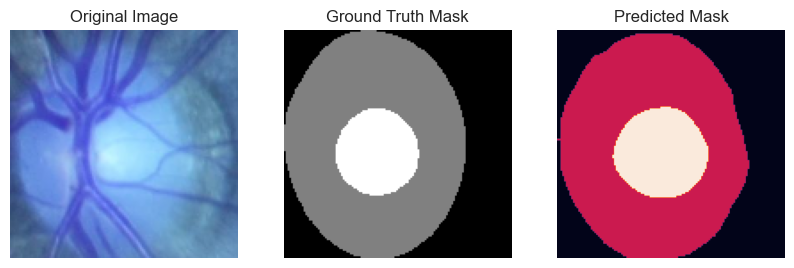

image_1700


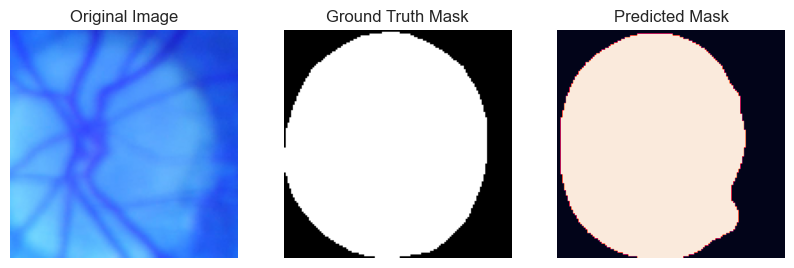

g0033


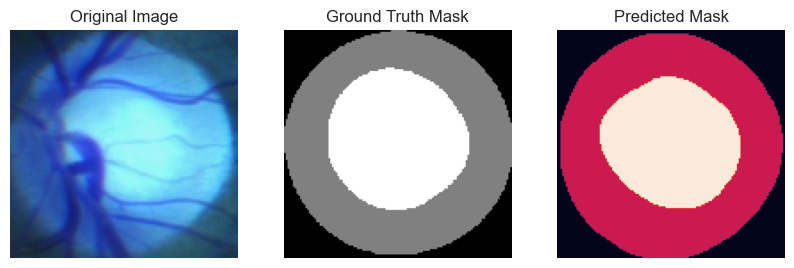

n0099


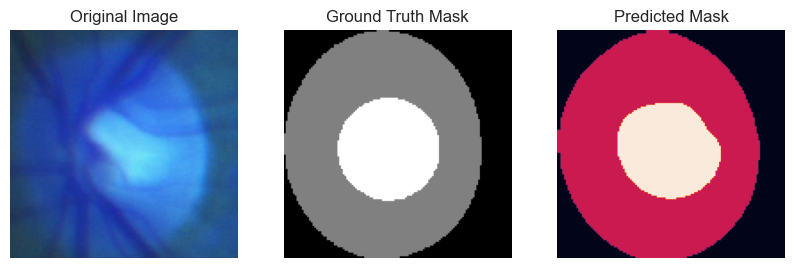

image_1607


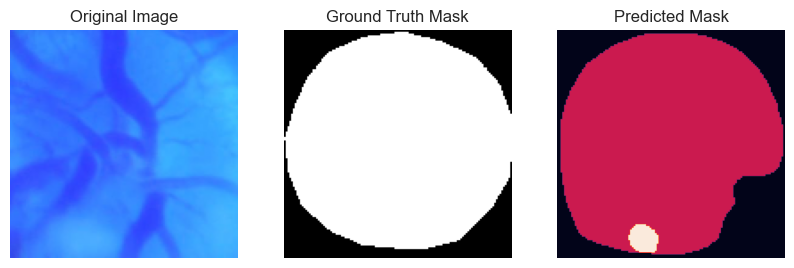

image_2781


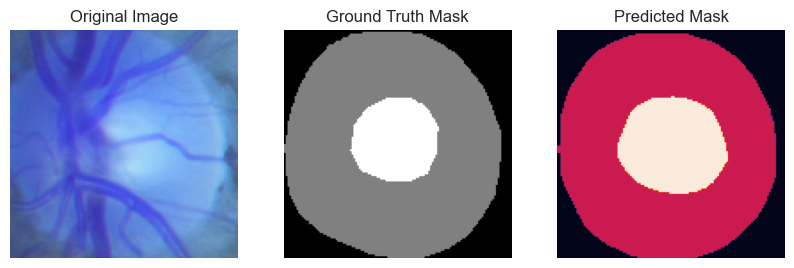

V0090


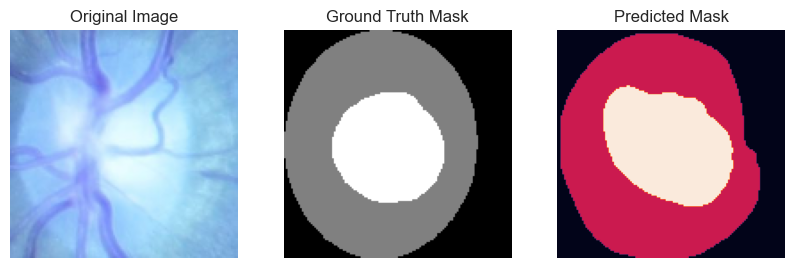

n0248


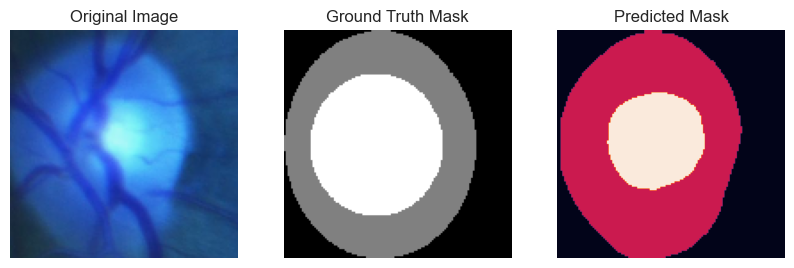

image_1712


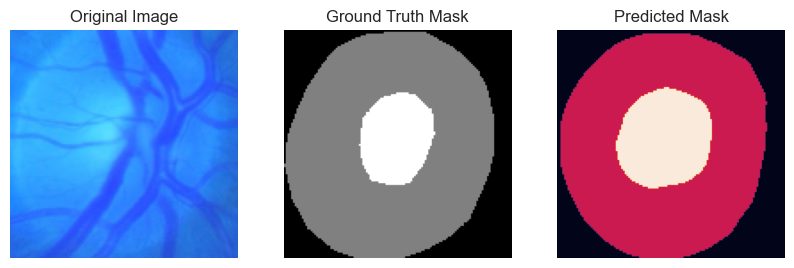

image_1977


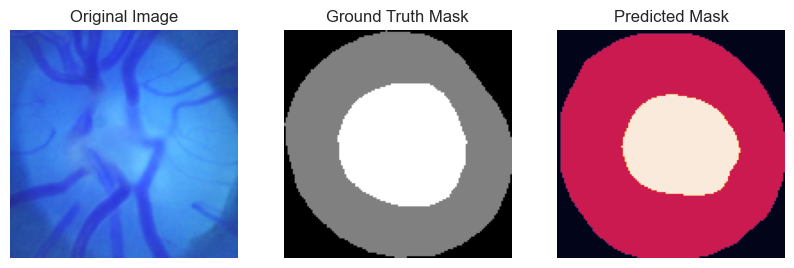

n0294


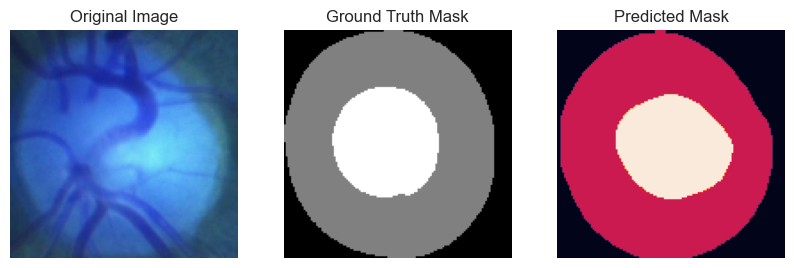

V0211


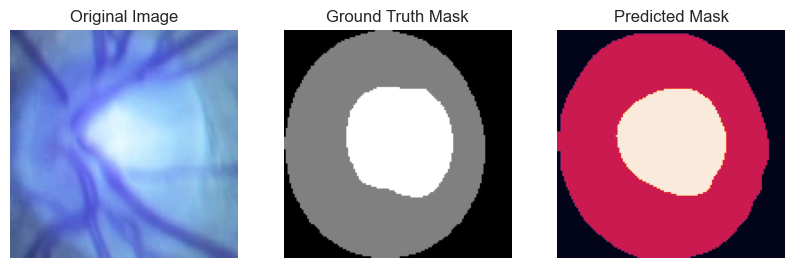

636


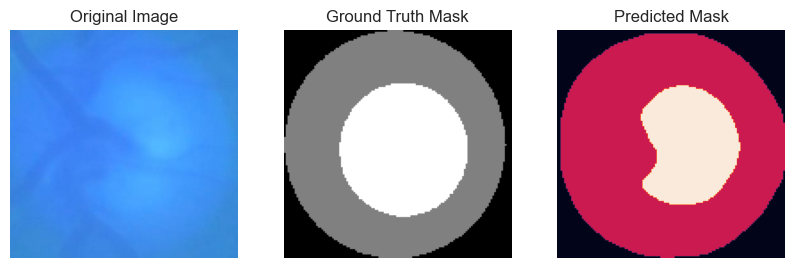

n0118


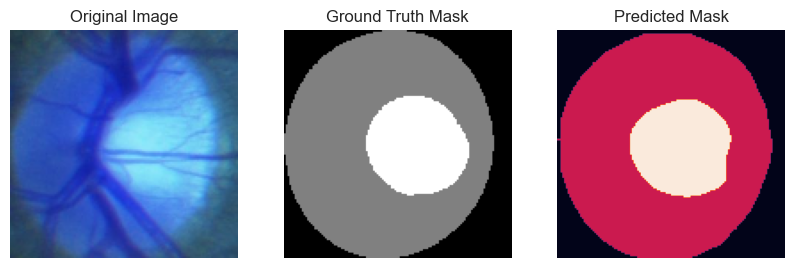

022


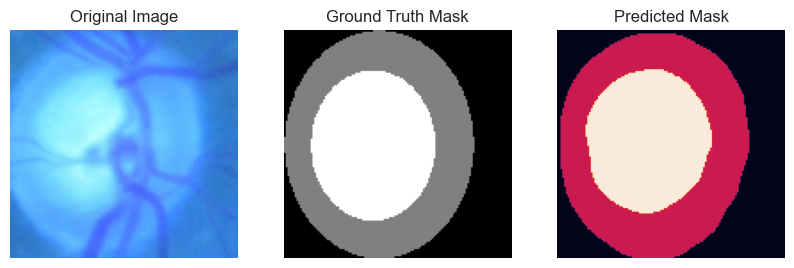

image_1226


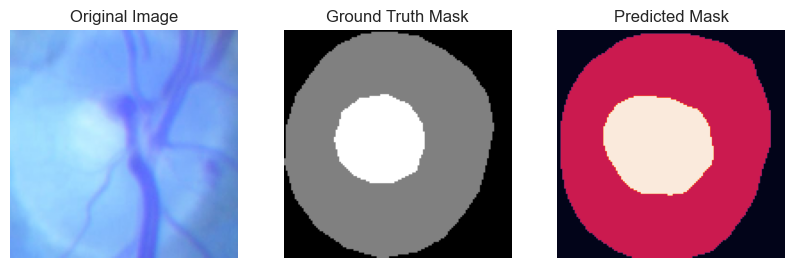

505


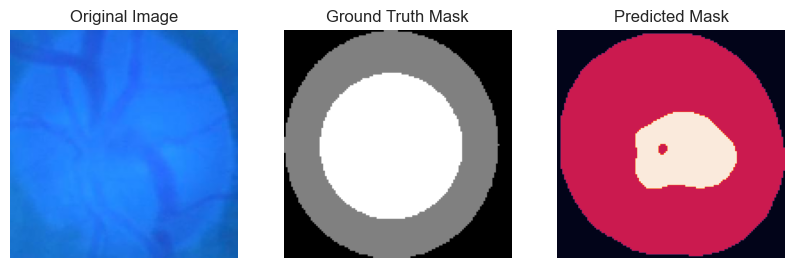

038


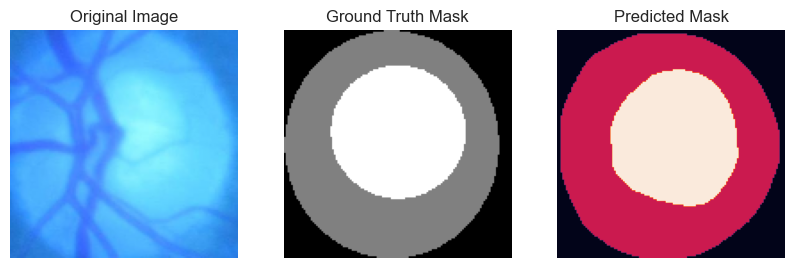

524


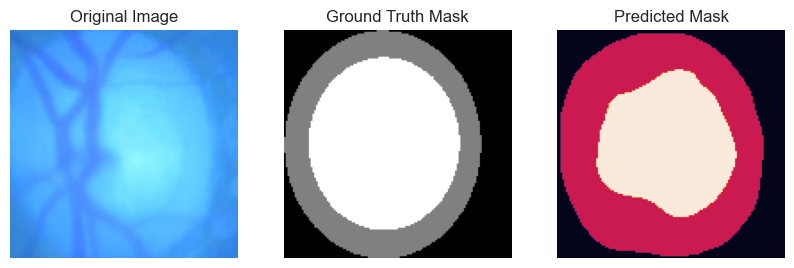

image_598


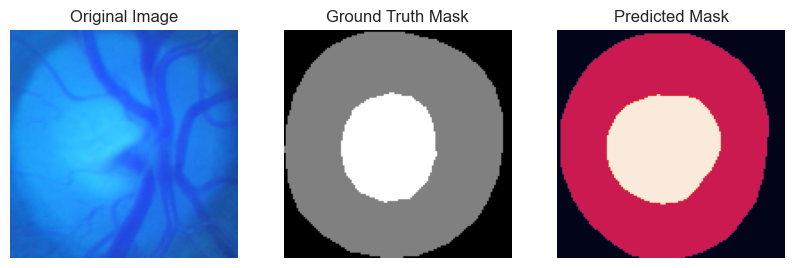

n0179


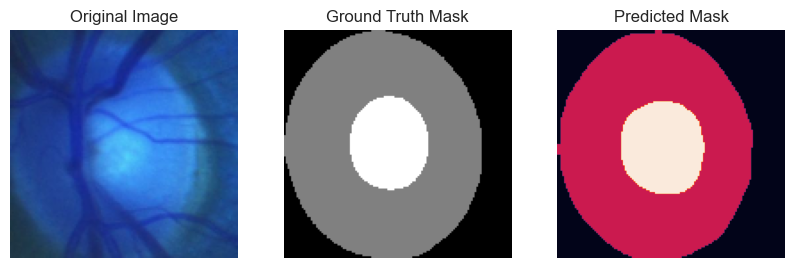

image_2656


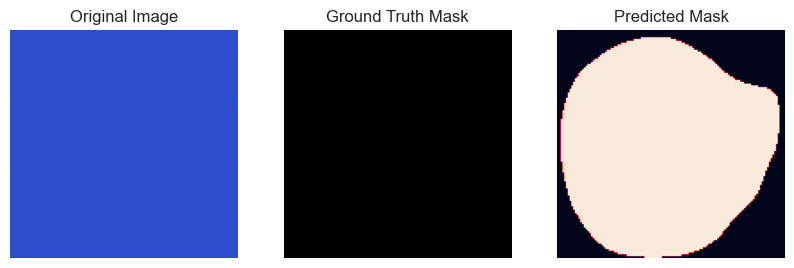

image_583


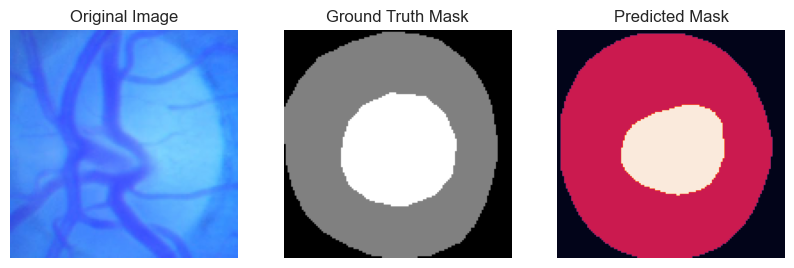

image_3131


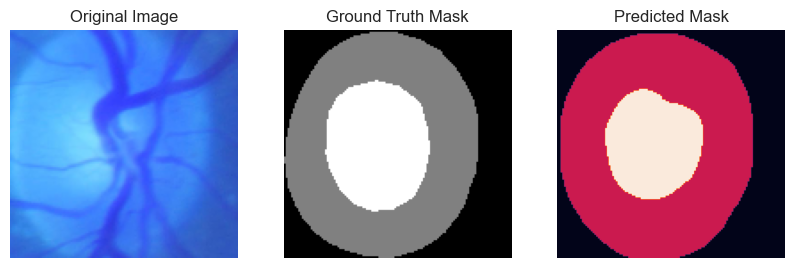

n0355


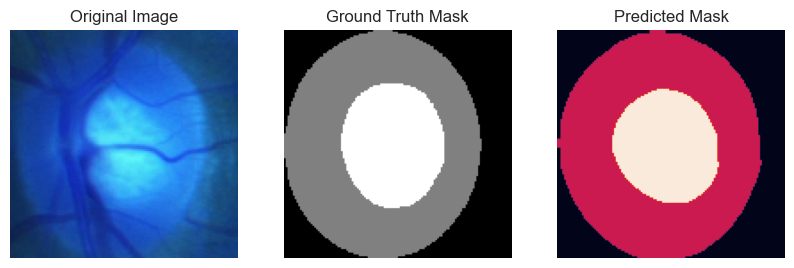

480


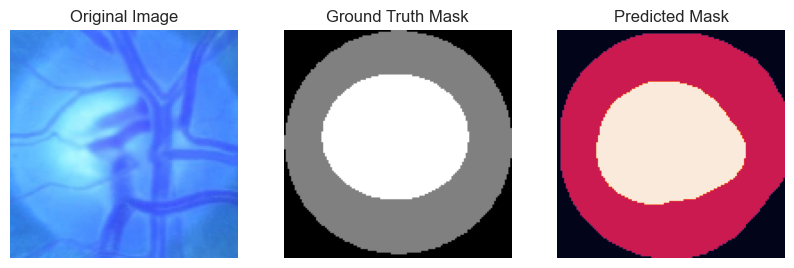

image_1896


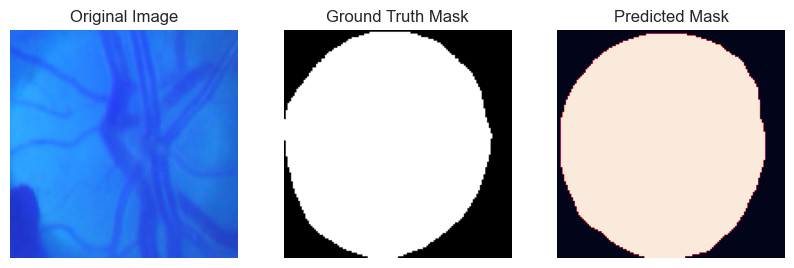

image_2436


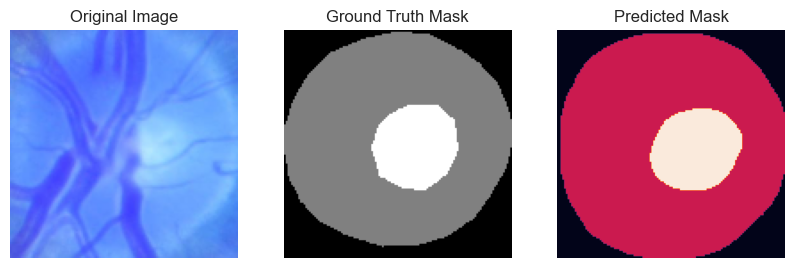

301


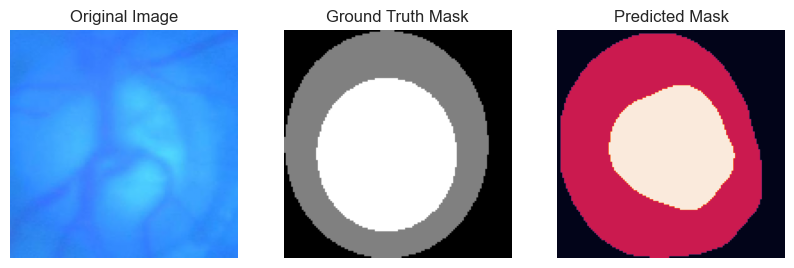

n0020


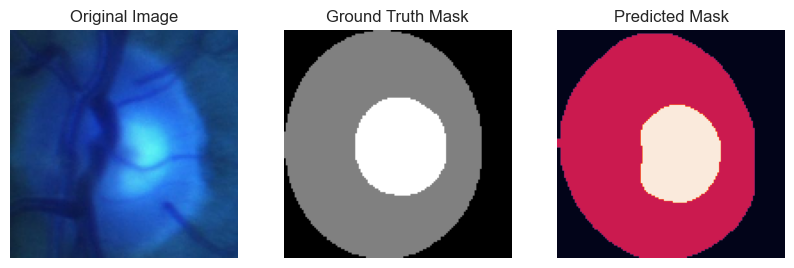

image_1190


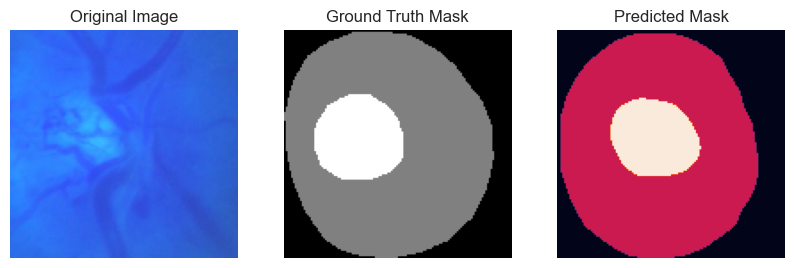

n0239


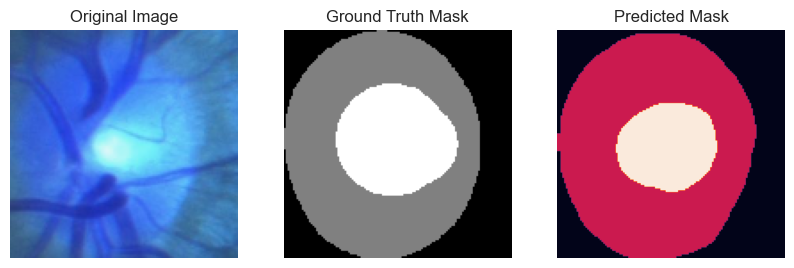

image_2935


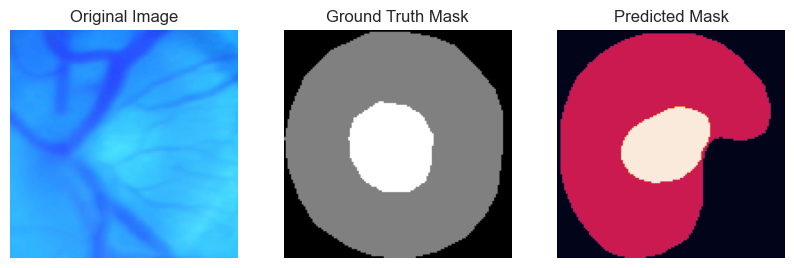

253


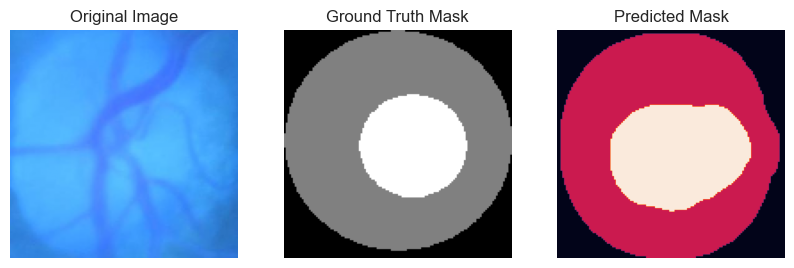

157


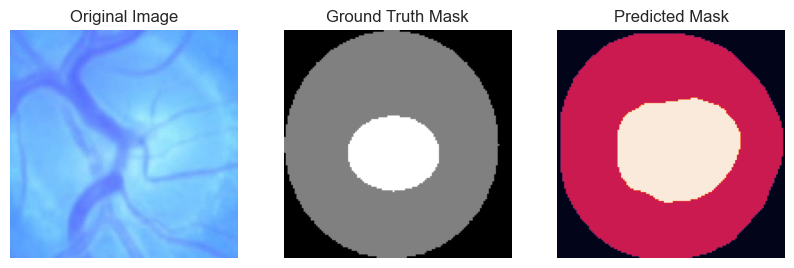

image_3166


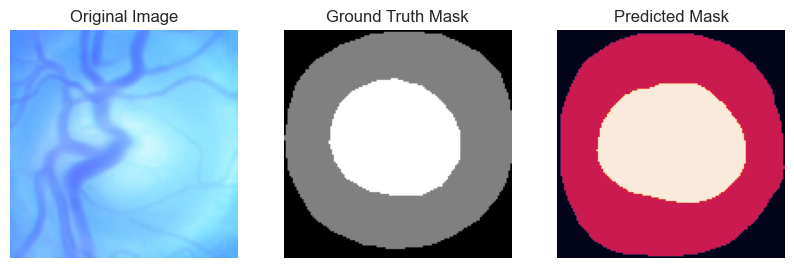

image_2149


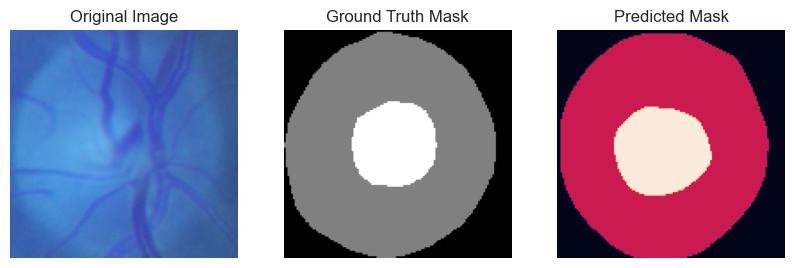

image_2354


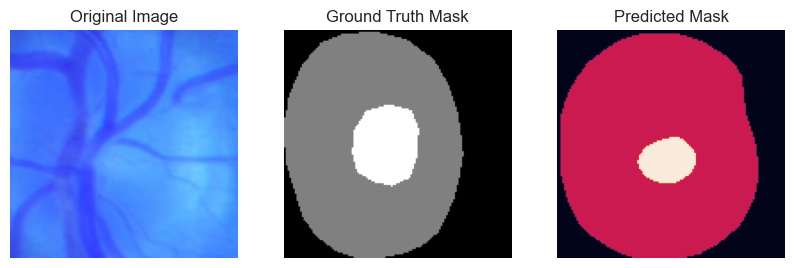

V0017


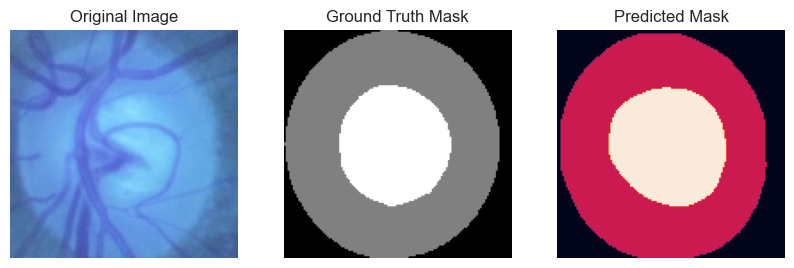

V0378


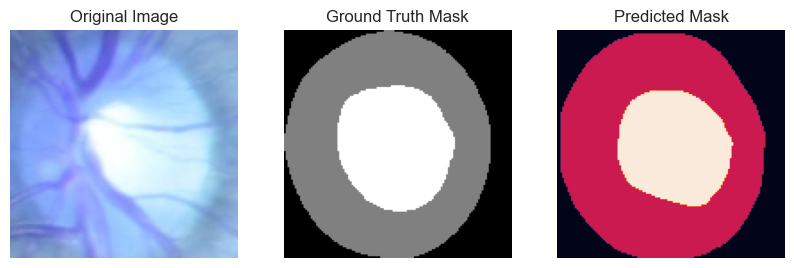

n0111


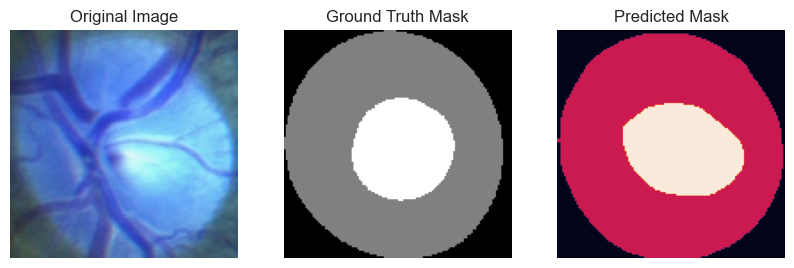

265


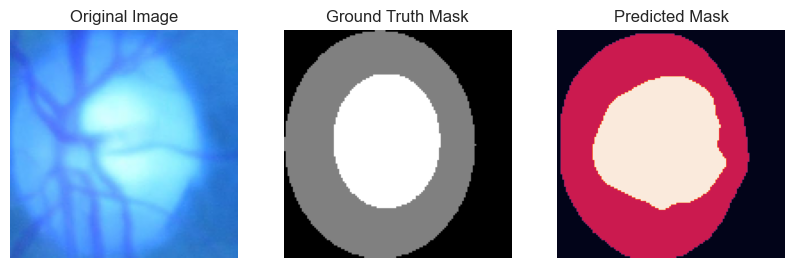

image_2936


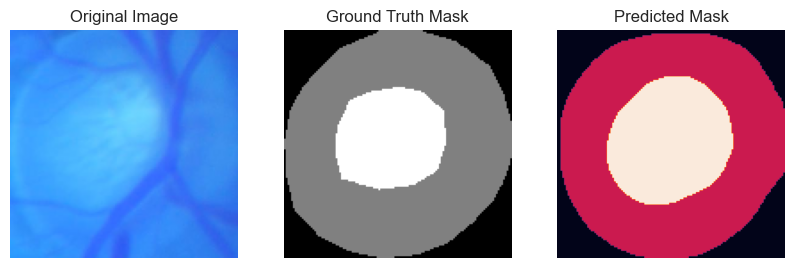

image_2973


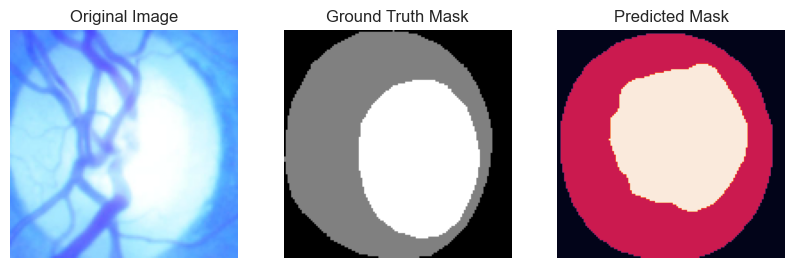

020


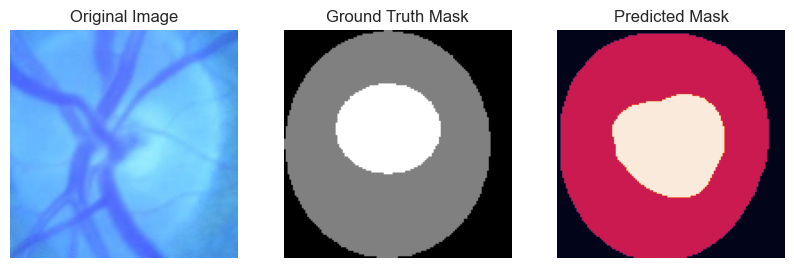

image_3080


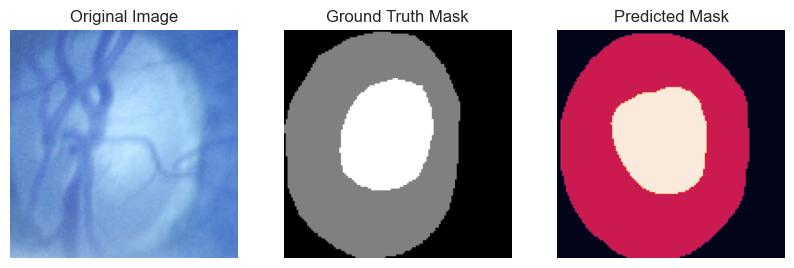

473


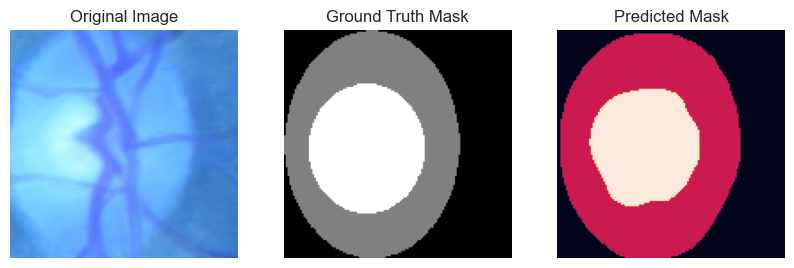

image_2412


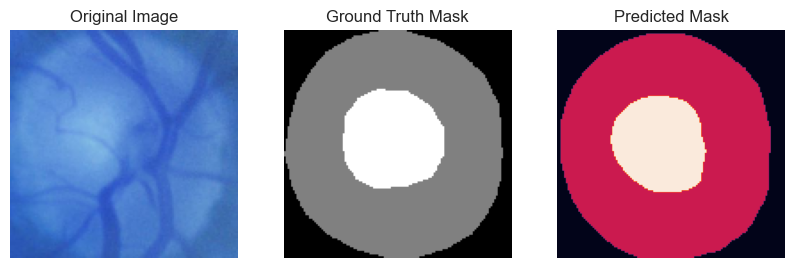

image_1384


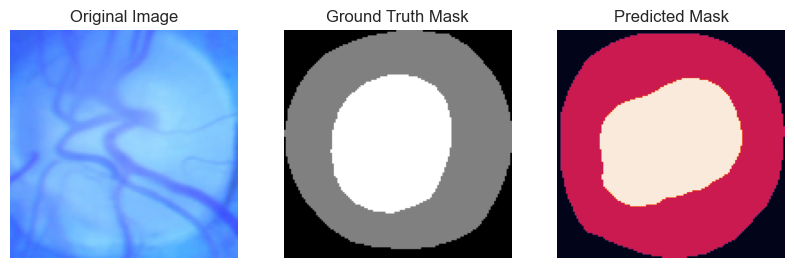

image_2471


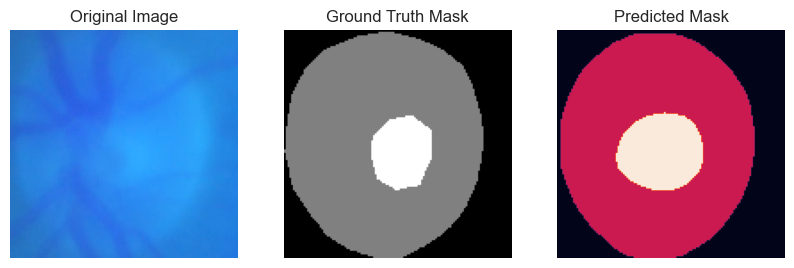

n0353


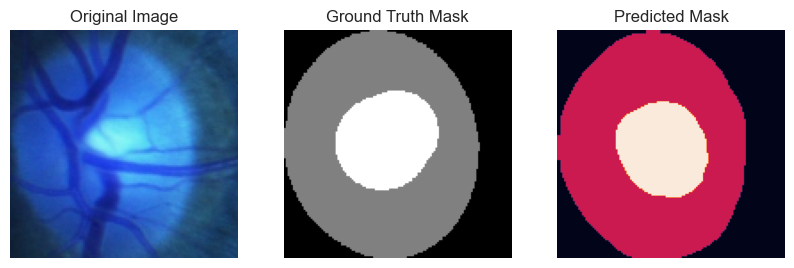

V0335


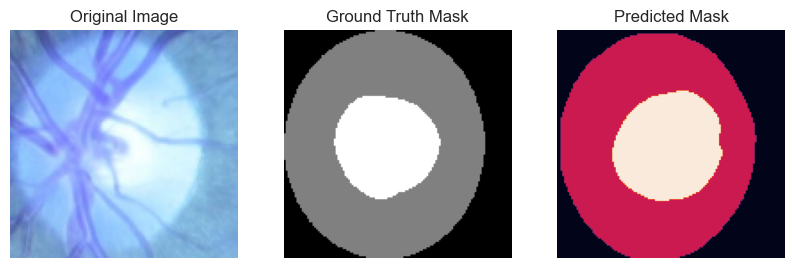

277


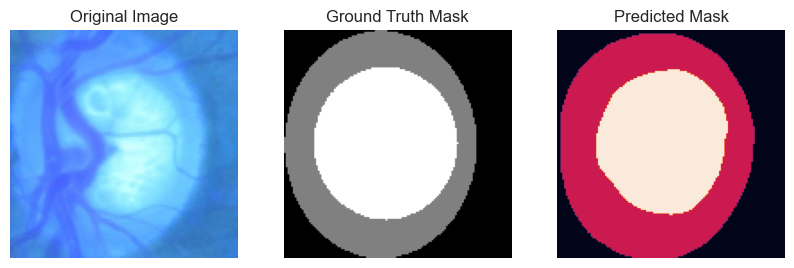

V0205


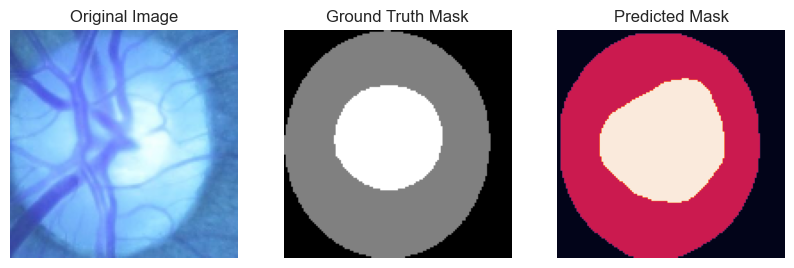

image_2314


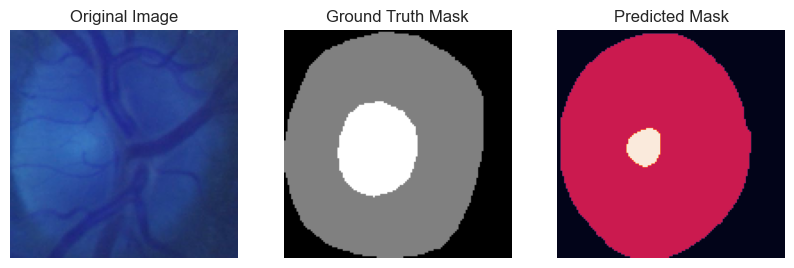

578


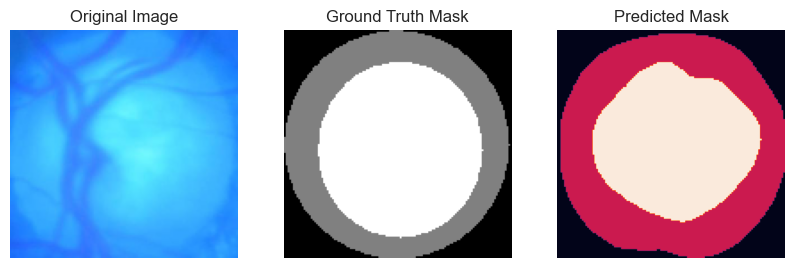

519


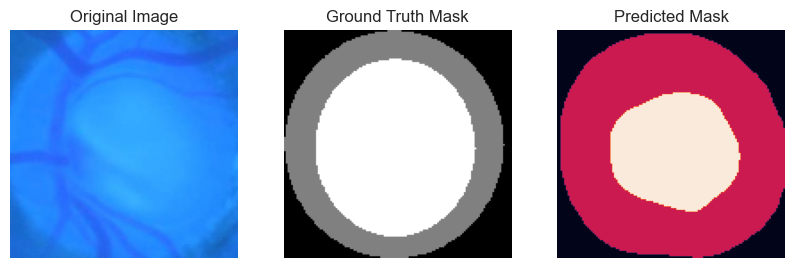

V0024


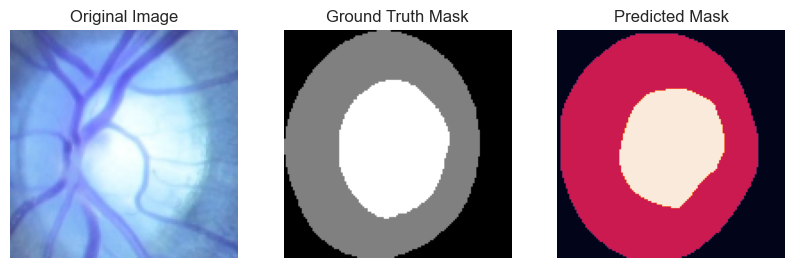

g0016


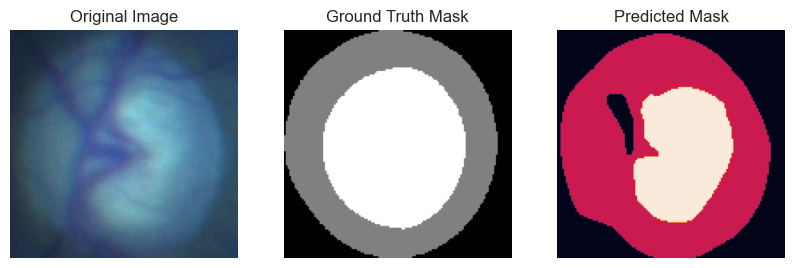

image_2860


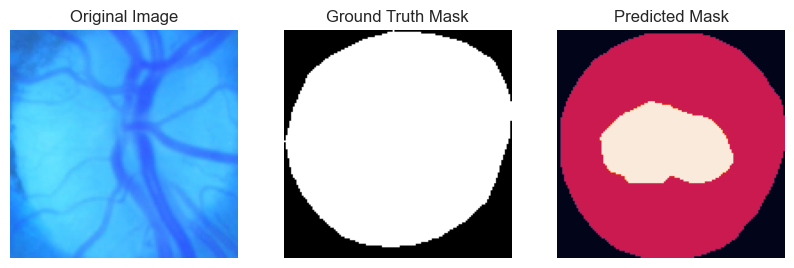

324


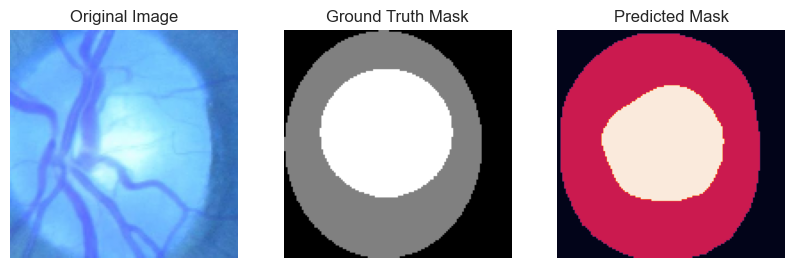

V0348


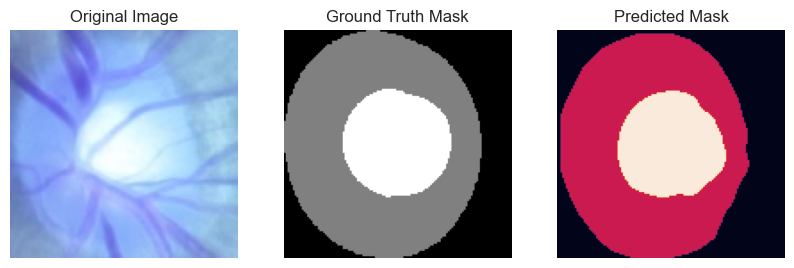

image_857


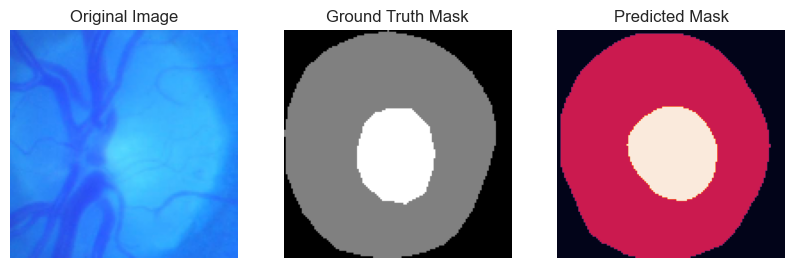

image_868


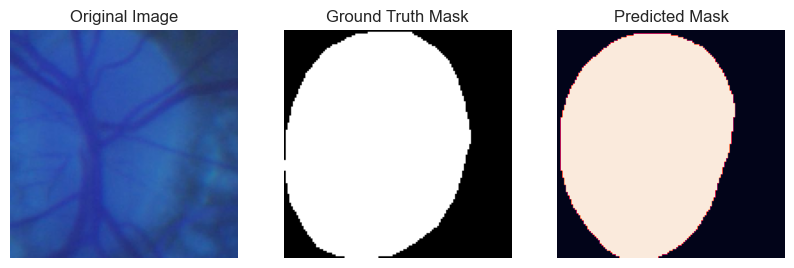

247


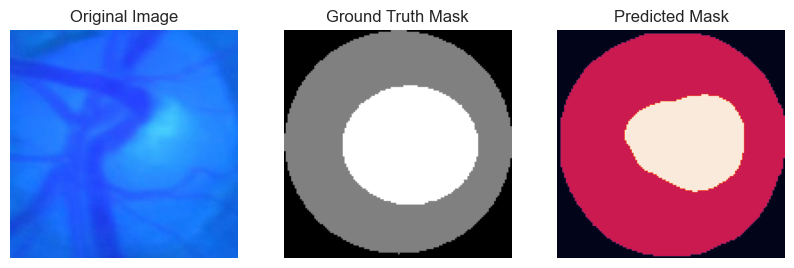

V0097


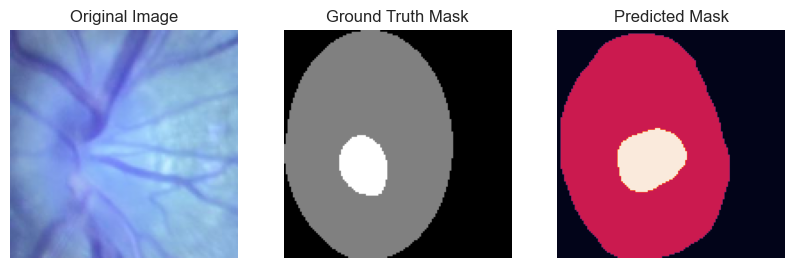

image_1332


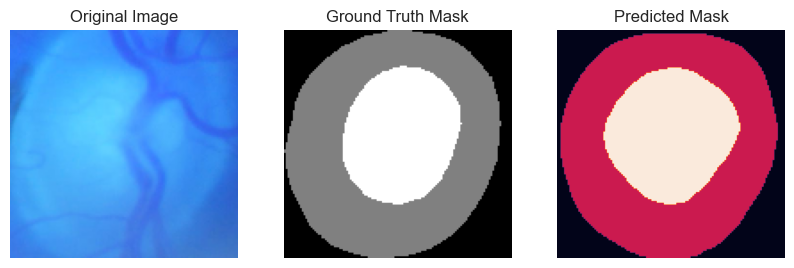

image_2362


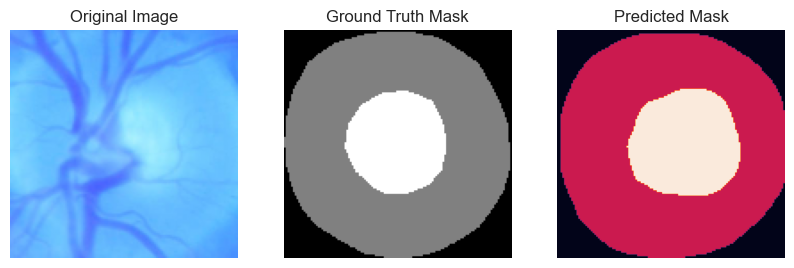

624


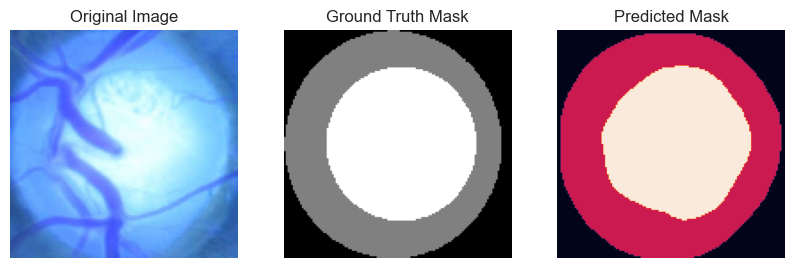

V0268


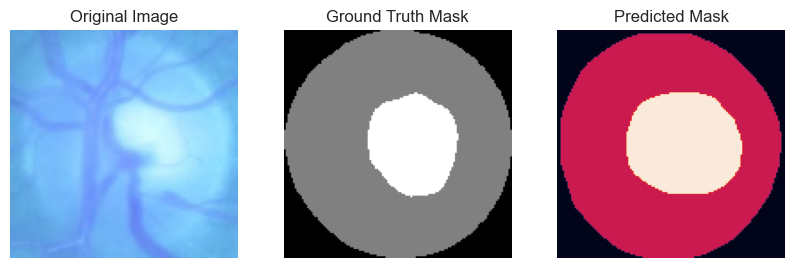

205


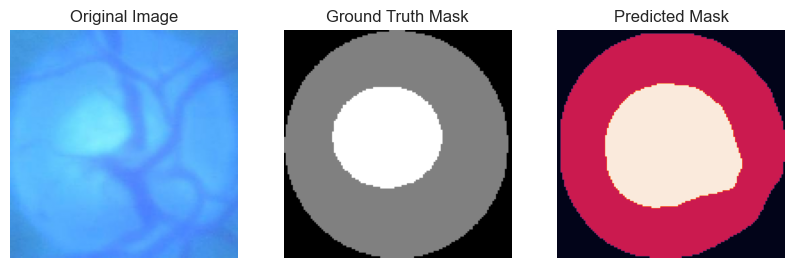

image_1271


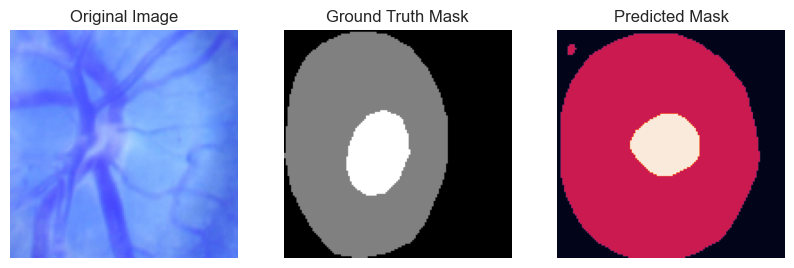

image_1925


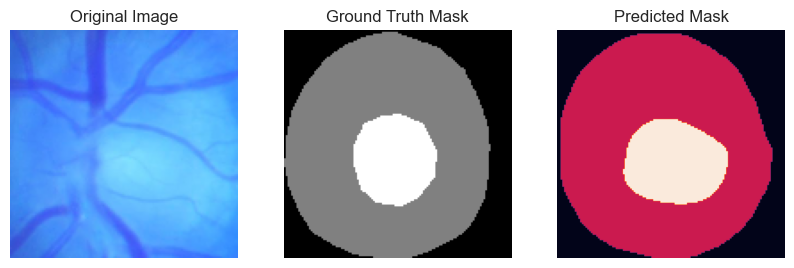

V0247


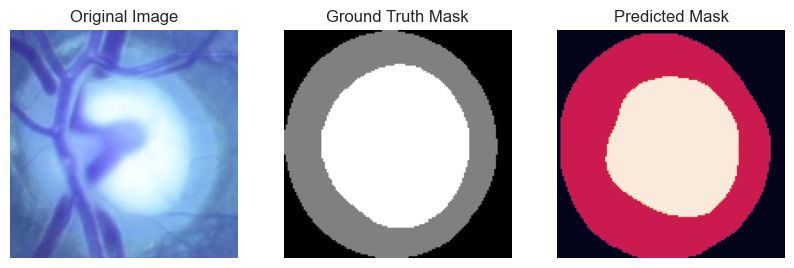

V0114


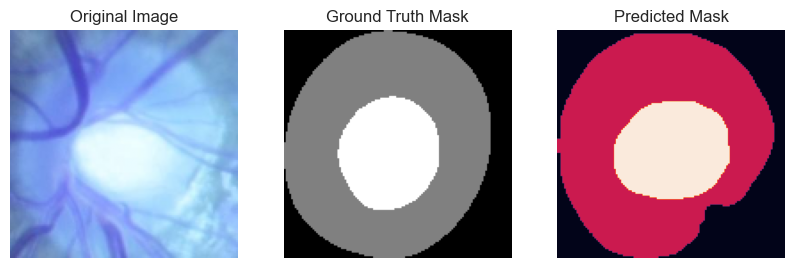

329


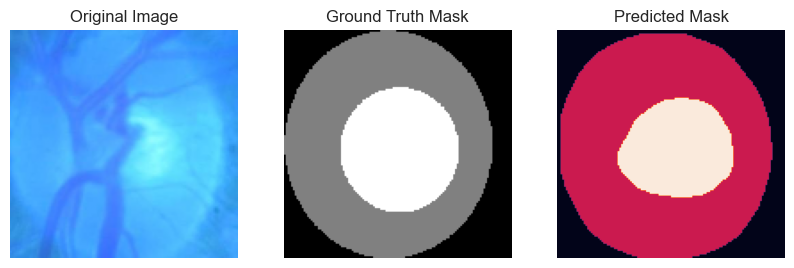

n0264


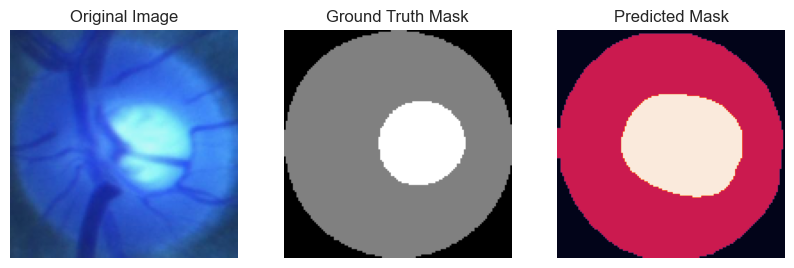

V0098


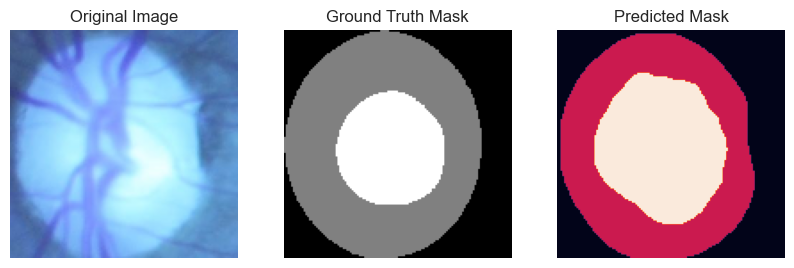

image_2345


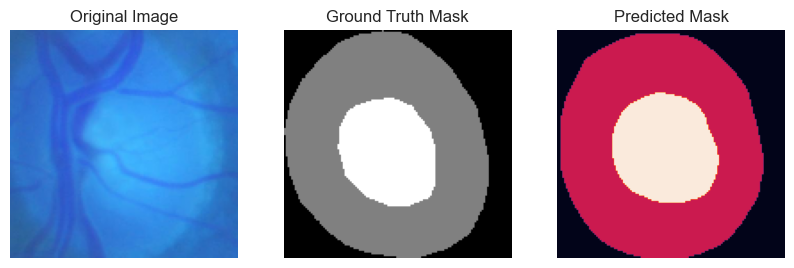

231


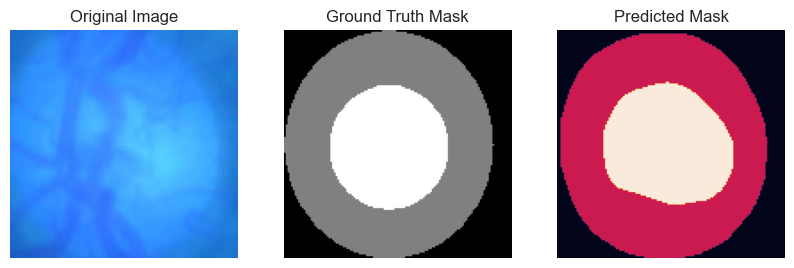

V0347


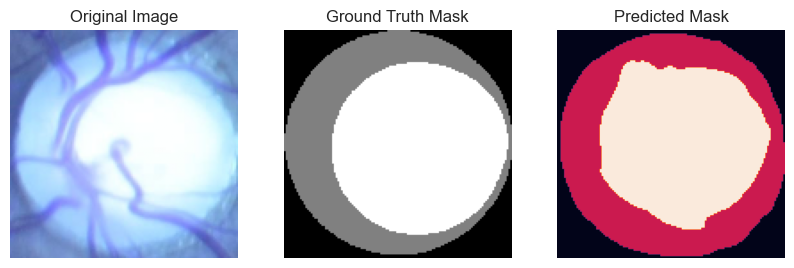

image_234


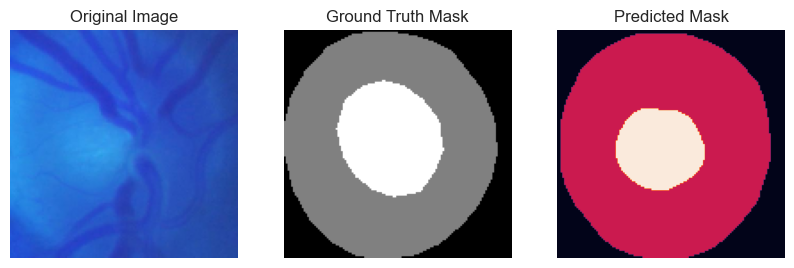

image_2562


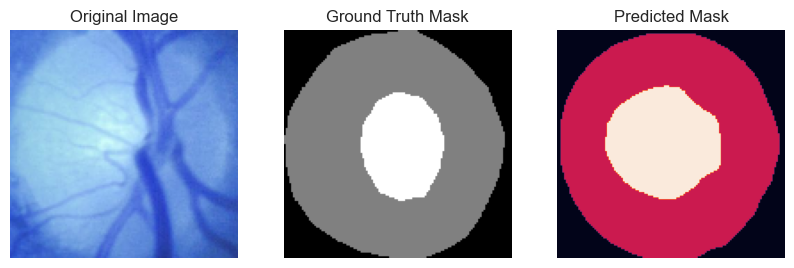

588


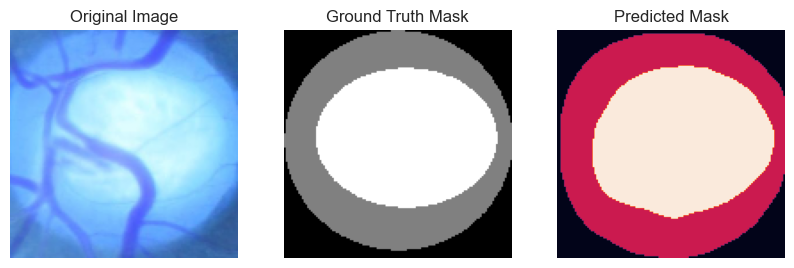

474


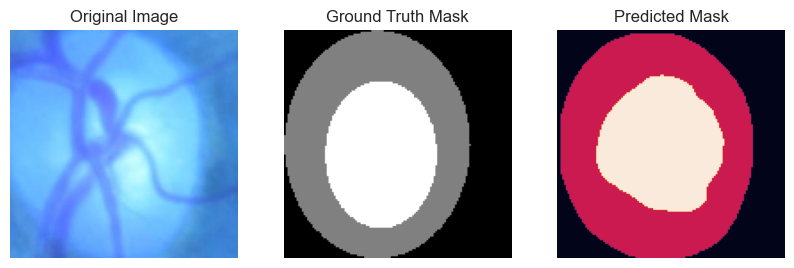

image_778


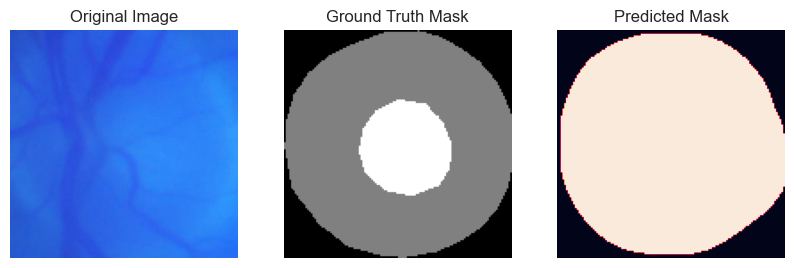

n0064


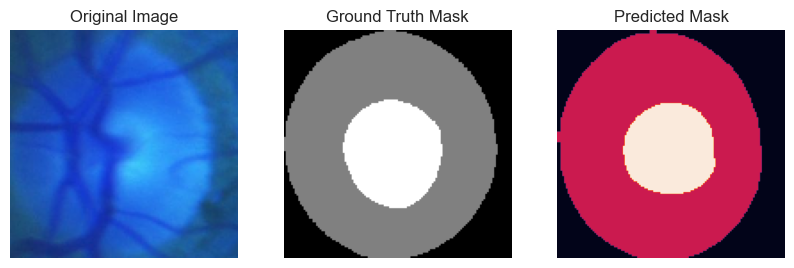

In [ ]:
def apply_morphological_close(image, kernel_size=(2,2)):
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, kernel_size)
    return cv2.morphologyEx(image, cv2.MORPH_CLOSE, kernel)

# Iterate over predicted masks
for i in range(len(predicted_masks)):
    test_image = x_test[i, :, :]
    real_mask = np.argmax(y_test[i], axis=-1)  # assuming y_test has one-hot encoding
    predicted_mask = predicted_masks[i, :, :]
    original_name = image_names_test[i].split(".")[0]  # You need to ensure you have the original names stored
    print(image_names_test[i].split(".")[0])

    # Apply morphological operation
    predicted_mask = apply_morphological_close(predicted_mask)

    # Save the predicted mask to Google Drive
    predicted_mask_name = f"{original_name}.png"
    mask_path = os.path.join(output_directory, predicted_mask_name)
    # cv2.imwrite(mask_path, predicted_mask * 255)  # Assuming masks are in 0-1 range
    cv2.imwrite(mask_path, predicted_mask )  # Assuming masks are in 0-1 range

    # Append the data for Excel
    data['ImgName'].append(predicted_mask_name)
    data['Label'].append('')  # Optionally add labels if available

    # Optionally display the images and masks
    plt.figure(figsize=(10, 10))
    plt.subplot(1, 3, 1)
    plt.imshow(test_image)
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(real_mask, cmap='gray')
    plt.title('Ground Truth Mask')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(predicted_mask)
    plt.title('Predicted Mask')
    plt.axis('off')
    plt.show()

# Create a DataFrame and save to Excel
df = pd.DataFrame(data)
df.to_excel(excel_file_path, index=False)

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import glob

# Directory containing the masks
#directory_path = r"C:\Users\Admin\Documents\xbemberakova\pythonProject1\G1020\Masks_Cropped\Masks_Cropped\img"

# Get list of all mask file paths
mask_file_paths = glob.glob( r'C:\Users\Admin\Documents\xbemberakova\pythonProject1\Nove\NoveAllMaskyExpert\NoveAllMaskyExpert\Segmentacia\predicted\*.png')

# Flag to track if any mask contains the original set [0, 1, 2, 3]
found_original_set = False
counter = 0
counter2 = 0
# Process each mask
for mask_file_path in mask_file_paths:
    mask = cv2.imread(mask_file_path, cv2.IMREAD_GRAYSCALE)
    original_values = np.unique(mask)

    print(original_values)

    counter2 = counter2 + 1

    # Check if original values contain 0, 1, 2, 3
    if set(original_values) == {0, 1}:
        found_original_set = True
        filename = mask_file_path.split("\\")[-1]  # Extract filename from the path
        # Print the filename
        print("Mask with values [0, 1]:", filename)
        #os.remove(mask_file_path)
        counter = counter + 1
    else:
        filename = mask_file_path.split("\\")[-1]  # Extract filename from the path
        #print("Mask with values [0, 1, 2]:", filename)



if not found_original_set:
    print("All is ok")

print(counter)
print(counter2)

[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1]
Mask with values [0, 1]: image_1700.png
[0 1 2]
[0 1]
Mask with values [0, 1]: image_1896.png
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1]
Mask with values [0, 1]: image_2656.png
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1]
Mask with values [0, 1]: image_485.png
[0 1 2]
[0 1 2]
[0 1]
Mask with values [0, 1]: image_778.png
[0 1 2]
[0 1]
Mask with values [0, 1]: image_868.png
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]
[0 1 2]

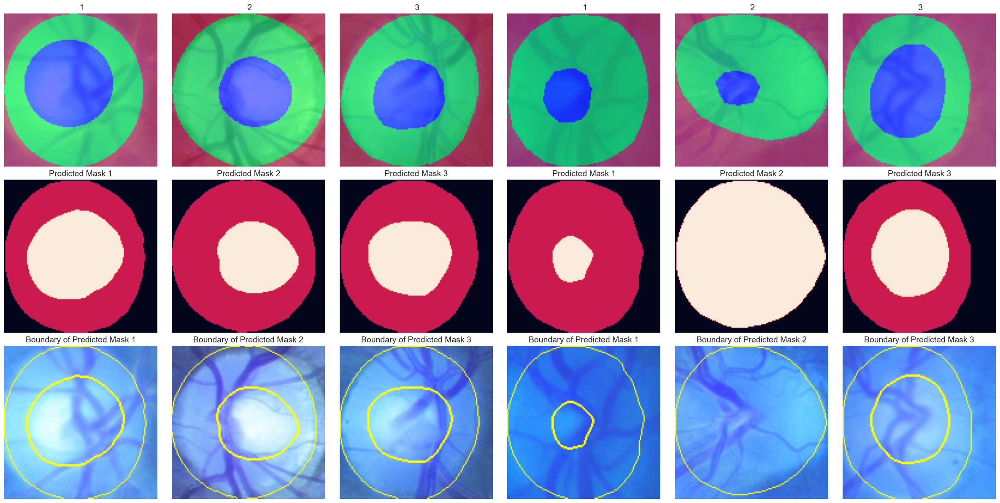

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import seaborn as sns
from skimage.segmentation import mark_boundaries
from skimage.color import label2rgb


def best_worst_predictions(x_test, y_test, predicted_masks, best_indices, worst_indices):
    # Plotting
    fig, axes = plt.subplots(3, 6, figsize=(24, 12))


    for i, best_index in enumerate(best_indices):
        best_image = x_test[best_index]
        best_real_mask = y_test[best_index]
        best_predicted_mask = predicted_masks[best_index]

        axes[0, i].imshow(best_image)
        axes[0, i].imshow(best_real_mask, cmap='Greens', alpha=0.5)
        axes[0, i].set_title(f' {i+1}', fontsize=14)
        axes[0, i].axis('off')

        axes[1, i].imshow(best_predicted_mask)
        axes[1, i].set_title(f'Predicted Mask {i+1}', fontsize=14)
        axes[1, i].axis('off')

        axes[2, i].imshow(mark_boundaries(best_image, best_predicted_mask))
        axes[2, i].set_title(f'Boundary of Predicted Mask {i+1}', fontsize=14)
        axes[2, i].axis('off')

    for j, worst_index in enumerate(worst_indices):
        worst_image = x_test[worst_index]
        worst_real_mask = y_test[worst_index]
        worst_predicted_mask = predicted_masks[worst_index]

        axes[0, j+3].imshow(worst_image)
        axes[0, j+3].imshow(worst_real_mask, cmap='Greens', alpha=0.5)
        axes[0, j+3].set_title(f' {j+1}', fontsize=14)
        axes[0, j+3].axis('off')

        axes[1, j+3].imshow(worst_predicted_mask)
        axes[1, j+3].set_title(f'Predicted Mask {j+1}', fontsize=14)
        axes[1, j+3].axis('off')

        axes[2, j+3].imshow(mark_boundaries(worst_image, worst_predicted_mask))
        axes[2, j+3].set_title(f'Boundary of Predicted Mask {j+1}', fontsize=14)
        axes[2, j+3].axis('off')

    plt.tight_layout()
    plt.show()

    return best_indices, worst_indices

# Seznamy indexů nejlepších a nejhorších předpovědí
best_indices = [4, 9, 10]  # Upravte na skutečné indexy
worst_indices = [19, 17, 45]  # Upravte na skutečné indexy

# Zavolejte funkci s danými seznamy indexů
best_indices, worst_indices = best_worst_predictions(x_test, y_test, predicted_masks, best_indices, worst_indices)

In [ ]:
import pandas as pd

# Načítanie záverečného excel súboru
df_final = pd.read_excel(r'C:\Users\Admin\Documents\xbemberakova\pythonProject1\Nove\klasotuput\predicted.xlsx')

# Načítanie excel súboru s hodnotami LABEL
df1 = pd.read_excel(r'C:\Users\Admin\Documents\xbemberakova\pythonProject1\Nove\NoveAllMaskyExpert\NoveAllMaskyExpert\Vybalancovane\2470image_labels.xlsx')

# Doplnenie hodnôt zo stĺpca "LABEL" zo súboru df1 do stĺpca "LABEL" v záverečnom súbore
for index, row in df_final.iterrows():
    img_name = row['ImgName']
    label_value = df1[df1['ImgName'] == img_name]['Label'].values
    if len(label_value) > 0:
        df_final.at[index, 'Label'] = label_value[0]

# Uloženie výsledného DataFrame do excel súboru
df_final.to_excel(r'C:\Users\Admin\Documents\xbemberakova\pythonProject1\Nove\klasotuput\final_predicted.xlsx', index=False)